Join the data from Part 1 with the data from Part 2 to create a new dataframe.

In [54]:
import pandas as pd
import sqlite3 as sqlite
import numpy as np
import folium

In [200]:
foursquare = pd.read_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/statistical_modeling/data/foursquare_results.csv')
foursquare.head()


,business_id,name,category_id,category,address,latitude,longitude,tel,rating
0,57f53ed7498e23279caaed8e,Txotx,13003,Bar,"Trondheimsveien 2, 0560 Oslo",59.919337,10.759947,921 69 062,9.1
1,4d6803f3709bb60c63f9b014,Le Benjamin Bar & Bistro,13148,French Restaurant,Søndre gate 6 (mellom Markveien & Thorvald Mey...,59.918750,10.758048,22 35 79 44,9.4
2,547a5140498e356dc652cfb7,Territoriet,13025,Wine Bar,"Markveien 58, 0550 Oslo",59.918887,10.757560,950 23 894,8.8
3,4bd1eaae77b29c74bb8f8d82,Glød,13003,Bar,"Thorvald Meyers gate 70 A (Korsgata), 0552 Oslo",59.920272,10.759572,930 03 674,8.2
4,5547ba21498e3c063aa9a7ba,Bd57,13006,Beer Bar,"Markveien 57, 0550 Oslo",59.919910,10.757172,923 11 315,8.4


In [201]:
yelp = pd.read_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/statistical_modeling/data/yelp_results.csv')
yelp.head()
len(yelp)

7929

In [202]:
#read in the bike sattion data
bike_stations_df = pd.read_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/statistical_modeling/data/stations_data.csv')
bike_stations_df.head()

,name,latitude,longitude,free bikes
0,Lille Schous plass,59.920259,10.760629,6
1,Sjølyst,59.921673,10.676660,15
2,Tøyenparken,59.915667,10.777567,4
3,Lindern,59.935888,10.735006,0
4,Uelands gate,59.929545,10.748986,10


<h5>Data cleaning and EDA<h5>

In [203]:
final_df = pd.concat([foursquare, yelp])
len(final_df)
#drop rows where longitude or latitude is NaN
final_df.dropna(subset=['latitude', 'longitude'], inplace=True)

#clean the database
final_df['category'].isna().value_counts()

#default for Yelp was restaurant so replace all NaN category values with restaurant
final_df['category'] = final_df['category'].fillna('Restaurant')
final_df['category'].isna().value_counts()


category
False    9181
Name: count, dtype: int64

In [295]:
final_df.head()

,business_id,name,category_id,category,address,latitude,longitude,rating,free bikes
0,57f53ed7498e23279caaed8e,Txotx,13003,Bar,"Øvingshotellet, Korsgata, Fredensborg, Grünerl...",59.919337,10.759947,9.1,NaN
1,4d6803f3709bb60c63f9b014,Le Benjamin Bar & Bistro,13148,French Restaurant,"Recharge Skøyen, Oslo kommune, Drammensveien, ...",59.918750,10.758048,9.4,NaN
2,547a5140498e356dc652cfb7,Territoriet,13025,Wine Bar,"85, Økernveien, Marienfryd, Grünerløkka, Oslo,...",59.918887,10.757560,8.8,NaN
3,4bd1eaae77b29c74bb8f8d82,Glød,13003,Bar,"Kirkeveien, Lindern, St. Hanshaugen, Oslo, 045...",59.920272,10.759572,8.2,NaN
4,5547ba21498e3c063aa9a7ba,Bd57,13006,Beer Bar,"38, Uelands gate, Lovisenberg, St. Hanshaugen,...",59.919910,10.757172,8.4,NaN


In [217]:
#clean the database
final_df['category'].isna().value_counts()

#default for Yelp was restaurant so replace all NaN category values with restaurant
final_df['category'] = final_df['category'].fillna('Bike Station')

final_df['category'].isna().value_counts()

category
False    9444
Name: count, dtype: int64

In [206]:
import re
#inspect the telephone column to see if its worth keeping
final_df['tel'].isna().value_counts()

#use regex to see how many phone numbers dont have the correct number of digits

expected_digits = 10

# Define the regex pattern to match the expected number of digits
pattern = r"^\d{" + str(expected_digits) + r"}$"

invalid_count = 0
valid_count = 0
for number in final_df['tel'].astype(str):
    if not re.match(pattern, number):
        invalid_count += 1
    else:
        valid_count += 1
print(f'invalid numbers: {invalid_count}\nValid numbers: {valid_count}')

final_df['tel'].isna().value_counts()

invalid numbers: 9181
Valid numbers: 0


tel
False    7997
True     1184
Name: count, dtype: int64

In [207]:
#drop the tel column
final_df.drop('tel', axis=1, inplace=True)

In [208]:
final_df.describe()
final_df[(final_df['rating'].isna() == False) & (final_df['category'] != 'Bike Station')].describe()

,category_id,latitude,longitude,rating
count,421.000000,8307.000000,8307.000000,8307.000000
mean,12977.273159,59.921236,10.743818,4.517010
std,615.967600,0.010010,0.021695,0.887906
min,10000.000000,59.896655,10.635312,1.000000
25%,13018.000000,59.913850,10.726814,4.000000
50%,13034.000000,59.919171,10.746730,4.500000
75%,13148.000000,59.927564,10.759157,5.000000
max,13383.000000,59.956020,10.819265,9.400000


In [209]:
#see how many non bike stations had a NaN rating
final_df[(final_df['rating'].isna() == True) & (final_df['category'] != 'Bike Station')]

#impute the NaN ratings with the rating mean
final_df['rating'] = final_df['rating'].fillna(final_df['rating'].mean())
final_df.describe()

,category_id,latitude,longitude,rating
count,1295.000000,9181.000000,9181.000000,9181.000000
mean,12992.133591,59.921615,10.743949,4.517010
std,599.383863,0.010394,0.024733,0.844582
min,10000.000000,59.894918,10.635136,1.000000
25%,13032.000000,59.913873,10.725900,4.000000
50%,13065.000000,59.919464,10.746864,4.500000
75%,13145.000000,59.927979,10.759618,4.517010
max,13383.000000,59.959953,10.827531,9.400000


In [212]:
from geopy.geocoders import Nominatim
#generate an address from the longitude and latitude for the bike sttations

subset = final_df[final_df['address'].isna() == True]
subset.head()

geolocator = Nominatim(user_agent="my-app")

#use reverse geolocation to assign addresses to rows that have a latitude and longitude but no listed address
for index, row in subset.iterrows():
    latitude = row['latitude']
    longitude = row['longitude']
    location = geolocator.reverse(f"{latitude}, {longitude}")
    if location is not None:
        final_df.at[index, 'address'] = location.address
final_df.head()

,business_id,name,category_id,category,address,latitude,longitude,rating,free bikes
0,57f53ed7498e23279caaed8e,Txotx,13003.0,Bar,"Øvingshotellet, Korsgata, Fredensborg, Grünerl...",59.919337,10.759947,9.1,NaN
1,4d6803f3709bb60c63f9b014,Le Benjamin Bar & Bistro,13148.0,French Restaurant,"Recharge Skøyen, Oslo kommune, Drammensveien, ...",59.918750,10.758048,9.4,NaN
2,547a5140498e356dc652cfb7,Territoriet,13025.0,Wine Bar,"85, Økernveien, Marienfryd, Grünerløkka, Oslo,...",59.918887,10.757560,8.8,NaN
3,4bd1eaae77b29c74bb8f8d82,Glød,13003.0,Bar,"Kirkeveien, Lindern, St. Hanshaugen, Oslo, 045...",59.920272,10.759572,8.2,NaN
4,5547ba21498e3c063aa9a7ba,Bd57,13006.0,Beer Bar,"38, Uelands gate, Lovisenberg, St. Hanshaugen,...",59.919910,10.757172,8.4,NaN


In [219]:
final_df['category_id'].value_counts()

category_id
13065.0    238
13145.0    119
13032.0    103
13064.0     92
13034.0     68
          ... 
13030.0      1
13029.0      1
13144.0      1
10037.0      1
13344.0      1
Name: count, Length: 88, dtype: int64

In [254]:
final_df[final_df['category_id'].isna() == True]

# Set bike station to an arbitrary category number
final_df.loc[final_df['category'] == 'Bike Station', 'category_id'] = 10000

# Set the NaN restaurants category id to the correct category
final_df.loc[final_df['category'] == 'Restaurant', 'category_id'] = 13065

#cast the category id from float to int
final_df['category_id'] = final_df['category_id'].astype(int)

final_df[final_df['category_id'].isna() == True]

final_df['rating'] = final_df['rating'].round(1)

In [255]:
final_df.head()

,business_id,name,category_id,category,address,latitude,longitude,rating,free bikes
0,57f53ed7498e23279caaed8e,Txotx,13003,Bar,"Øvingshotellet, Korsgata, Fredensborg, Grünerl...",59.919337,10.759947,9.1,NaN
1,4d6803f3709bb60c63f9b014,Le Benjamin Bar & Bistro,13148,French Restaurant,"Recharge Skøyen, Oslo kommune, Drammensveien, ...",59.918750,10.758048,9.4,NaN
2,547a5140498e356dc652cfb7,Territoriet,13025,Wine Bar,"85, Økernveien, Marienfryd, Grünerløkka, Oslo,...",59.918887,10.757560,8.8,NaN
3,4bd1eaae77b29c74bb8f8d82,Glød,13003,Bar,"Kirkeveien, Lindern, St. Hanshaugen, Oslo, 045...",59.920272,10.759572,8.2,NaN
4,5547ba21498e3c063aa9a7ba,Bd57,13006,Beer Bar,"38, Uelands gate, Lovisenberg, St. Hanshaugen,...",59.919910,10.757172,8.4,NaN


In [236]:
final_df['category'].value_counts()

category
Restaurant                     8124
Bike Station                    263
Fast Food Restaurant            119
Cafe, Coffee, and Tea House     103
Pizzeria                         92
                               ... 
Brewery                           1
Dim Sum Restaurant                1
Rock Club                         1
Dining and Drinking               1
Arcade                            1
Name: count, Length: 89, dtype: int64

In [ ]:
#convert names to reduce the number of categories

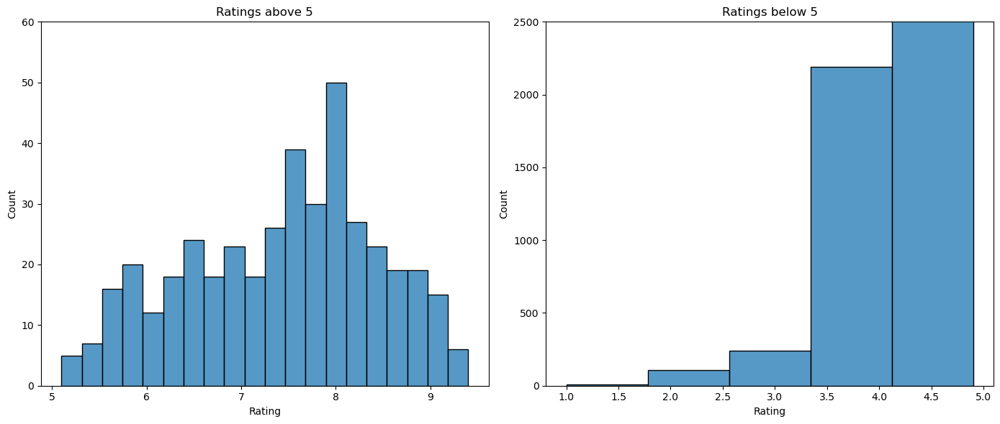

In [271]:
import seaborn as sns
import matplotlib.pyplot as plt

#seperated above 5 and below 5 to give a better visual

# Rating mask for ratings above 5
rate_mask_above_5 = final_df[(final_df['rating'].isna() == False) & (final_df['rating'] > 5)]

# Rating mask for ratings below 5
rate_mask_below_5 = final_df[(final_df['rating'].isna() == False) & (final_df['rating'] < 5)]

# Create subplots with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Ratings above 5
sns.histplot(data=rate_mask_above_5, x='rating', ax=axs[0], bins=20)
axs[0].set_title('Ratings above 5')
axs[0].set_xlabel('Rating')
axs[0].set_ylabel('Count')
axs[0].set_ylim(0, 60)

# Subplot 2: Ratings below 5
sns.histplot(data=rate_mask_below_5, x='rating', ax=axs[1], bins=5)
axs[1].set_title('Ratings below 5')
axs[1].set_xlabel('Rating')
axs[1].set_ylabel('Count')
axs[1].set_ylim(0, 2500)

# Adjust spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()

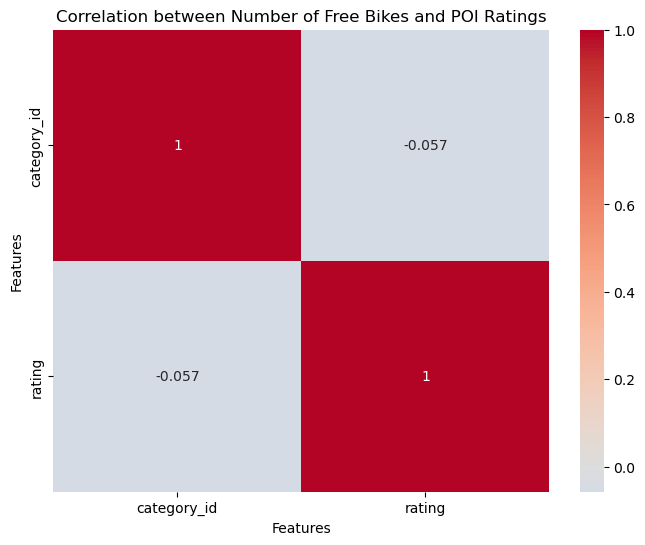

In [278]:
# Filter the relevant columns from the dataframe

data_subset = final_df[['category_id', 'rating']]


# Compute the correlation matrix
corr_matrix = data_subset.corr()

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)

# Customize the plot
plt.title('Correlation between category_id and POI Ratings')
plt.xlabel('Features')
plt.ylabel('Features')

# Display the plot
plt.show()


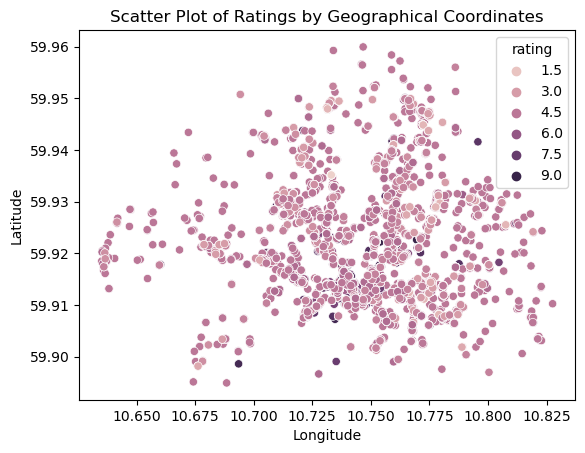

In [300]:
data_filtered = final_df[final_df['rating'].isna() == False]

# Create a scatter plot using Seaborn
sns.scatterplot(data=data_filtered, x='longitude', y='latitude', hue='rating')

# Customize the plot
plt.title('Scatter Plot of Ratings by Geographical Coordinates')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Display the plot
plt.show()

Provide a visualization that you used as part of your EDA process. Explain the initial pattern or relationship you discoved through this visualization. 

In [241]:
# Create a folium map of Oslo Norway
map = folium.Map(location=[59.9139, 10.7522], zoom_start=15)

#colour coded popular POI's and defaulted everything else to blue
category_colors = {
    'Bike Station': 'lightgreen',
    'Restaurant': 'lightblue',
    'Bar': 'pink',
    'Fast Food Restaurant': 'darkred',
    'Cafe, Coffee, and Tea House': 'black'

      # Add more categories and their corresponding colors
}

default_colour = 'blue'
# Iterate over your data points and add markers to the map
for index, row in final_df.iterrows():
    # Extract the latitude and longitude values from your data
    latitude = row['latitude']
    longitude = row['longitude']
    
    # Get the category of the location
    category = row['category']
    
    # Get the corresponding marker color for the category
    marker_color = category_colors.get(category, default_colour)
    
    # Create a marker with a popup containing information about the location
    popup_text = f"Venue: {row['name']}\nCategory: {category}\nAddress: {row['address']}\nRating: {row['rating']}"
    marker = folium.Marker([latitude, longitude], 
                           popup=popup_text,
                           icon=folium.Icon(color=marker_color),
                          )
    
    # Add the marker to the map
    marker.add_to(map)

#show the map
map

The map created above is used to show visually the proximity of POI's to the bike stations in Oslo, Norway. I chose the map because it is a nice visual display of the database and having it overlayed on the streets makes the geographic portion of the data more concrete. 

The image below 

# Database

Put all your results in an SQLite3 database (remember, SQLite stores its databases as files in your local machine - make sure to create your database in your project's data/ directory!)

In [105]:
import sqlite3 as sqlite

conn = sqlite.connect('api_data.db')

cursor = conn.cursor()

create_table_querey = """
    CREATE TABLE location (    
        id INTEGER PRIMARY KEY AUTOINCREMENT, 
        latitude VARCHAR,
        longitude VARCHAR, 
        address VARCHAR,
        business_id VARCHAR, 
        station_id INTEGER
        FOREIGN KEY (business_id) REFERENCES restaurants(business_id)
        FOREIGN KEY (station_id) REFERENCES locations(station_id)

    )
"""
cursor.execute(create_table_query)

for idx, row in final_df.iterrows():
    insert_query = "INSERT INTO location (latitude, longitude, address, business_id) VALUES (?, ?, ?, ?)"
    values = (row['latitude'], row['longitude'], row['address'], row['business_id'])
    cursor.execute(insert_query, values)



#location table which will be for the restaurants and the bike locations

Look at the data before and after the join to validate your data.